## Animation of SIR model

In [1]:
import hypernetx as hnx
import matplotlib.pyplot as plt
import random
import time
import hypernetx.algorithms.contagion as contagion
import numpy as np
from IPython.display import HTML

In [2]:
n = 100
m = 40

hyperedgeList = [random.sample(range(n), k=random.choice([2,3])) for i in range(m)]
H = hnx.Hypergraph(hyperedgeList)

## Initialize simulation variables
- $\tau$ is a dictionary of the infection rate for each hyperedge size
- $\gamma$ is the healing rate
- $t_{max}$ is the time at which to terminate the simulation if it hasn't already
- $\Delta t$ is the time step size to use for the discrete time algorithm

In [3]:
tau = {2:2, 3:1}
gamma = 0.1
tmax = 50
dt = 1

In [4]:
transition_events = contagion.discrete_SIR(H, tau, gamma, rho=0.2, tmin=0, tmax=tmax, dt=dt, return_full_data=True)

In [5]:
for time, events in transition_events.items():
    if events != []:
        for event in events:
            if event[0] == 'R':
                print(f"At time {time}, {event[1]} recovered")
            elif event[0] == 'I' and event[2] is not None:
                print(f"At time {time}, {event[1]} was infected by {event[2]}")

At time 1, 76 was infected by 0
At time 1, 29 was infected by 0
At time 1, 17 was infected by 1
At time 1, 30 was infected by 4
At time 1, 95 was infected by 4
At time 1, 2 was infected by 25
At time 1, 93 was infected by 38
At time 1, 8 was infected by 30
At time 1, 53 was infected by 7
At time 1, 83 was infected by 9
At time 1, 43 was infected by 9
At time 1, 52 recovered
At time 1, 11 was infected by 10
At time 1, 51 was infected by 10
At time 1, 75 was infected by 11
At time 1, 88 was infected by 13
At time 1, 78 was infected by 13
At time 1, 16 was infected by 30
At time 1, 67 was infected by 25
At time 1, 40 recovered
At time 1, 38 was infected by 28
At time 1, 46 was infected by 32
At time 1, 25 was infected by 35
At time 1, 1 was infected by 35
At time 1, 21 was infected by 38
At time 2, 62 was infected by 24
At time 2, 95 recovered
At time 2, 97 was infected by 5
At time 2, 66 was infected by 5
At time 2, 73 was infected by 17
At time 2, 93 recovered
At time 2, 86 was infected

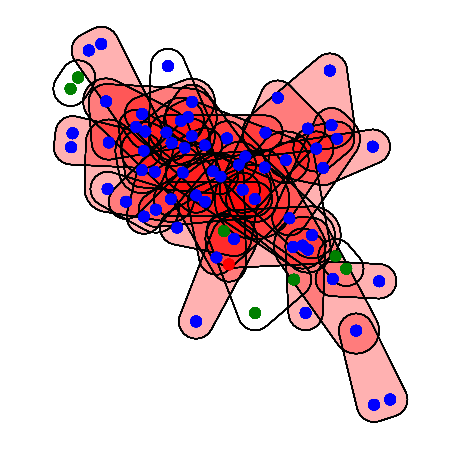

In [6]:
node_state_color_dict = {"S":"green", "I":"red", "R":"blue"}
edge_state_color_dict = {"S":(0, 1, 0, 0.3), "I":(1, 0, 0, 0.3), "R":(0, 0, 1, 0.3), "OFF": (1, 1, 1, 0)}

fps = 1

fig = plt.figure()
animation = contagion.contagion_animation(fig, H, transition_events, node_state_color_dict, edge_state_color_dict, node_radius=1, fps=fps)

In [7]:
HTML(animation.to_jshtml())

## Animation of the SIS model

In [8]:
transition_events = contagion.discrete_SIS(H, tau, gamma, rho=0.2, tmin=0, tmax=tmax, dt=dt, return_full_data=True)

In [9]:
for time, events in transition_events.items():
    if events != []:
        for event in events:
            if event[0] == 'S':
                print(f"At time {time}, {event[1]} recovered")
            elif event[0] == 'I' and event[2] is not None:
                print(f"At time {time}, {event[1]} was infected by {event[2]}")

At time 1, 76 was infected by 14
At time 1, 17 was infected by 26
At time 1, 37 was infected by 8
At time 1, 54 was infected by 3
At time 1, 97 was infected by 5
At time 1, 93 was infected by 38
At time 1, 13 was infected by 11
At time 1, 86 was infected by 8
At time 1, 83 was infected by 9
At time 1, 52 was infected by 9
At time 1, 19 was infected by 10
At time 1, 11 recovered
At time 1, 51 was infected by 10
At time 1, 22 was infected by 11
At time 1, 78 was infected by 13
At time 1, 63 was infected by 36
At time 1, 89 was infected by 19
At time 1, 12 was infected by 18
At time 1, 16 was infected by 19
At time 1, 74 was infected by 22
At time 1, 67 was infected by 25
At time 1, 39 was infected by 25
At time 1, 40 was infected by 26
At time 1, 23 was infected by 29
At time 1, 90 recovered
At time 1, 84 was infected by 32
At time 1, 46 was infected by 32
At time 1, 81 was infected by 36
At time 1, 21 recovered
At time 1, 58 was infected by 37
At time 1, 15 was infected by 37
At time 2,

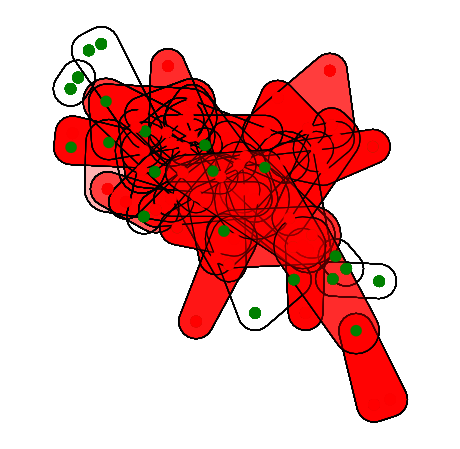

In [10]:
node_state_color_dict = {"S":"green", "I":"red", "R":"blue"}
edge_state_color_dict = {"S":(0, 1, 0, 0.3), "I":(1, 0, 0, 0.3), "R":(0, 0, 1, 0.3), "OFF": (1, 1, 1, 0)}

fps = 1

fig = plt.figure()
animation = contagion.contagion_animation(fig, H, transition_events, node_state_color_dict, edge_state_color_dict, node_radius=1, fps=fps)

In [11]:
HTML(animation.to_jshtml())